<a href="https://colab.research.google.com/github/NoeSin/PrimerEntrega-Milozzi-Sincosky/blob/main/AnalisisMultivariado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

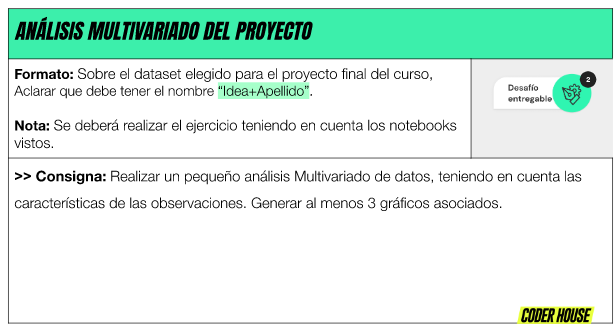

## Obtencion de datos y formateo.

Los datos estan normalizados, para el analisis los obtuvimos en el entregable anterior.
https://colab.research.google.com/drive/1onqVNR8evjH_Bkq-6-F1LBb9CntF68Ut?usp=sharing


In [ ]:
#Importamos las librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd "/content/drive/MyDrive/DataScience/Entregables/Clase34"

/content/drive/MyDrive/DataScience/Entregables/Clase34


In [ ]:
df = pd.read_csv('clientes_productos.csv')
df

,Unnamed: 0,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,duracion_int,range_age
0,0,C2448,76,female,2017-01-01,NaN,2046 days,True,prd_1,annual_subscription,1200,12,2046,"(75, 80]"
1,1,C2449,61,male,2017-01-01,2021-09-05,1708 days,False,prd_1,annual_subscription,1200,12,1708,"(60, 65]"
2,2,C2450,58,female,2017-01-01,2019-01-13,742 days,False,prd_1,annual_subscription,1200,12,742,"(55, 60]"
3,3,C2451,62,female,2017-01-01,NaN,2046 days,True,prd_2,monthly_subscription,125,1,2046,"(60, 65]"
4,4,C2452,71,male,2017-01-01,2021-06-28,1639 days,False,prd_1,annual_subscription,1200,12,1639,"(70, 75]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508927,508927,C511375,53,male,2021-12-31,NaN,221 days,True,prd_2,monthly_subscription,125,1,221,"(50, 55]"
508928,508928,C511376,60,male,2021-12-31,NaN,221 days,True,prd_2,monthly_subscription,125,1,221,"(55, 60]"
508929,508929,C511377,67,female,2021-12-31,NaN,221 days,True,prd_2,monthly_subscription,125,1,221,"(65, 70]"
508930,508930,C511378,49,male,2021-12-31,NaN,221 days,True,prd_2,monthly_subscription,125,1,221,"(45, 50]"


In [ ]:
df.drop(["Unnamed: 0"],axis=1,inplace=True)
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 508932 entries, 0 to 508931
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   customer_id    508932 non-null  object
 1   age            508932 non-null  int64 
 2   gender         508932 non-null  object
 3   fecha_inicio   508932 non-null  object
 4   fecha_fin      112485 non-null  object
 5   duracion       508932 non-null  object
 6   activo         508932 non-null  bool  
 7   product_id     508932 non-null  object
 8   name           508932 non-null  object
 9   price          508932 non-null  int64 
 10  billing_cycle  508932 non-null  int64 
 11  duracion_int   508932 non-null  int64 
 12  range_age      508932 non-null  object
dtypes: bool(1), int64(4), object(8)
memory usage: 47.1+ MB


In [ ]:
df['fecha_inicio']=df['fecha_inicio'].astype('datetime64')

In [ ]:
df['fecha_fin']=df['fecha_fin'].astype('datetime64')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 508932 entries, 0 to 508931
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   customer_id    508932 non-null  object        
 1   age            508932 non-null  int64         
 2   gender         508932 non-null  object        
 3   fecha_inicio   508932 non-null  datetime64[ns]
 4   fecha_fin      112485 non-null  datetime64[ns]
 5   duracion       508932 non-null  object        
 6   activo         508932 non-null  bool          
 7   product_id     508932 non-null  object        
 8   name           508932 non-null  object        
 9   price          508932 non-null  int64         
 10  billing_cycle  508932 non-null  int64         
 11  duracion_int   508932 non-null  int64         
 12  range_age      508932 non-null  object        
dtypes: bool(1), datetime64[ns](2), int64(4), object(6)
memory usage: 47.1+ MB


In [ ]:
dfConCasos = pd.read_csv('clientes_productos_casos.csv')
dfConCasos

,Unnamed: 0,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,case_id,date_time,channel,reason,indicador
0,0,C2448,76,female,2017-01-01 00:00:00,NaN,2046 days,True,prd_1,annual_subscription,1200,12,CC101,2017-01-01 10:32:03,phone,signup,both
1,1,C2449,61,male,2017-01-01 00:00:00,2021-09-05 00:00:00,1708 days,False,prd_1,annual_subscription,1200,12,CC102,2017-01-01 11:35:47,phone,signup,both
2,2,C2450,58,female,2017-01-01 00:00:00,2019-01-13 00:00:00,742 days,False,prd_1,annual_subscription,1200,12,CC103,2017-01-01 11:37:09,phone,signup,both
3,3,C2451,62,female,2017-01-01 00:00:00,NaN,2046 days,True,prd_2,monthly_subscription,125,1,CC104,2017-01-01 13:28:14,phone,signup,both
4,4,C2451,62,female,2017-01-01 00:00:00,NaN,2046 days,True,prd_2,monthly_subscription,125,1,CC4491,2017-03-31 12:06:58,phone,support,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
580779,580779,C511375,53,male,2021-12-31 00:00:00,NaN,221 days,True,prd_2,monthly_subscription,125,1,NaN,NaN,NaN,NaN,left_only
580780,580780,C511376,60,male,2021-12-31 00:00:00,NaN,221 days,True,prd_2,monthly_subscription,125,1,NaN,NaN,NaN,NaN,left_only
580781,580781,C511377,67,female,2021-12-31 00:00:00,NaN,221 days,True,prd_2,monthly_subscription,125,1,NaN,NaN,NaN,NaN,left_only
580782,580782,C511378,49,male,2021-12-31 00:00:00,NaN,221 days,True,prd_2,monthly_subscription,125,1,NaN,NaN,NaN,NaN,left_only


In [ ]:
dfConCasos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 580784 entries, 0 to 580783
Data columns (total 17 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Unnamed: 0     580784 non-null  int64 
 1   customer_id    580784 non-null  object
 2   age            580784 non-null  int64 
 3   gender         580784 non-null  object
 4   fecha_inicio   580784 non-null  object
 5   fecha_fin      129593 non-null  object
 6   duracion       580784 non-null  object
 7   activo         580784 non-null  bool  
 8   product_id     580784 non-null  object
 9   name           580784 non-null  object
 10  price          580784 non-null  int64 
 11  billing_cycle  580784 non-null  int64 
 12  case_id        330512 non-null  object
 13  date_time      330512 non-null  object
 14  channel        330512 non-null  object
 15  reason         330512 non-null  object
 16  indicador      580784 non-null  object
dtypes: bool(1), int64(4), object(12)
memory usage: 7

In [ ]:
dfConCasos.drop(["Unnamed: 0"],axis=1,inplace=True)
dfConCasos['fecha_inicio']=dfConCasos['fecha_inicio'].astype('datetime64')
dfConCasos['fecha_fin']=dfConCasos['fecha_fin'].astype('datetime64')
dfConCasos['date_time']=dfConCasos['date_time'].astype('datetime64')
dfConCasos.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 580784 entries, 0 to 580783
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   customer_id    580784 non-null  object        
 1   age            580784 non-null  int64         
 2   gender         580784 non-null  object        
 3   fecha_inicio   580784 non-null  datetime64[ns]
 4   fecha_fin      129593 non-null  datetime64[ns]
 5   duracion       580784 non-null  object        
 6   activo         580784 non-null  bool          
 7   product_id     580784 non-null  object        
 8   name           580784 non-null  object        
 9   price          580784 non-null  int64         
 10  billing_cycle  580784 non-null  int64         
 11  case_id        330512 non-null  object        
 12  date_time      330512 non-null  datetime64[ns]
 13  channel        330512 non-null  object        
 14  reason         330512 non-null  object        
 15  

In [ ]:
dfConCasos.describe(include='all',datetime_is_numeric=True)

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,case_id,date_time,channel,reason,indicador
count,580784,580784.000000,580784,580784,129593,580784,580784,580784,580784,580784.000000,580784.000000,330512,330512,330512,330512,580784
unique,508932,NaN,2,NaN,NaN,2046,2,2,2,NaN,NaN,330512,NaN,2,2,2
top,C20510,NaN,male,NaN,NaN,582 days,True,prd_1,annual_subscription,NaN,NaN,CC101,NaN,phone,support,both
freq,5,NaN,349454,NaN,NaN,1158,451191,354529,354529,NaN,NaN,1,NaN,286840,200985,330512
mean,NaN,58.341015,NaN,2020-02-15 03:50:47.588088064,2020-09-29 00:55:22.179438592,NaN,NaN,NaN,NaN,781.214143,7.714749,NaN,2020-05-10 03:17:34.812911360,NaN,NaN,NaN
min,NaN,21.000000,NaN,2017-01-01 00:00:00,2017-01-08 00:00:00,NaN,NaN,NaN,NaN,125.000000,1.000000,NaN,2017-01-01 10:32:03,NaN,NaN,NaN
25%,NaN,53.000000,NaN,2019-04-15 00:00:00,2020-03-01 00:00:00,NaN,NaN,NaN,NaN,125.000000,1.000000,NaN,2019-06-30 16:11:01.249999872,NaN,NaN,NaN
50%,NaN,59.000000,NaN,2020-04-29 00:00:00,2020-12-31 00:00:00,NaN,NaN,NaN,NaN,1200.000000,12.000000,NaN,2020-08-07 13:42:24,NaN,NaN,NaN
75%,NaN,64.000000,NaN,2021-03-11 00:00:00,2021-07-23 00:00:00,NaN,NaN,NaN,NaN,1200.000000,12.000000,NaN,2021-06-06 14:11:54.500000,NaN,NaN,NaN
max,NaN,78.000000,NaN,2021-12-31 00:00:00,2021-12-31 00:00:00,NaN,NaN,NaN,NaN,1200.000000,12.000000,NaN,2022-01-01 06:32:53,NaN,NaN,NaN


In [ ]:
df.activo = df.activo.replace({False:'Baja',True:'Activo'})
dfConCasos.activo = dfConCasos.activo.replace({False:'Baja',True:'Activo'})

In [ ]:
df[['fecha_fin','activo']]

,fecha_fin,activo
0,NaT,Activo
1,2021-09-05,Baja
2,2019-01-13,Baja
3,NaT,Activo
4,2021-06-28,Baja
...,...,...
508927,NaT,Activo
508928,NaT,Activo
508929,NaT,Activo
508930,NaT,Activo


In [ ]:
from datetime import date
dfConCasos['fin_calculo'] = dfConCasos['fecha_fin'].fillna(date.today()).astype('datetime64').dt.date.astype('datetime64')
dfConCasos['duracion_meses'] = ((dfConCasos.fin_calculo - dfConCasos.fecha_inicio)/np.timedelta64(1, 'M'))
dfConCasos['duracion_meses'] = dfConCasos['duracion_meses'].astype(int)
dfConCasos.drop(['fin_calculo'],axis=1 ,inplace=True  )
dfConCasos.head()

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,case_id,date_time,channel,reason,indicador,duracion_meses
0,C2448,76,female,2017-01-01,NaT,2046 days,Activo,prd_1,annual_subscription,1200,12,CC101,2017-01-01 10:32:03,phone,signup,both,67
1,C2449,61,male,2017-01-01,2021-09-05,1708 days,Baja,prd_1,annual_subscription,1200,12,CC102,2017-01-01 11:35:47,phone,signup,both,56
2,C2450,58,female,2017-01-01,2019-01-13,742 days,Baja,prd_1,annual_subscription,1200,12,CC103,2017-01-01 11:37:09,phone,signup,both,24
3,C2451,62,female,2017-01-01,NaT,2046 days,Activo,prd_2,monthly_subscription,125,1,CC104,2017-01-01 13:28:14,phone,signup,both,67
4,C2451,62,female,2017-01-01,NaT,2046 days,Activo,prd_2,monthly_subscription,125,1,CC4491,2017-03-31 12:06:58,phone,support,both,67


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 508932 entries, 0 to 508931
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   customer_id    508932 non-null  object        
 1   age            508932 non-null  int64         
 2   gender         508932 non-null  object        
 3   fecha_inicio   508932 non-null  datetime64[ns]
 4   fecha_fin      112485 non-null  datetime64[ns]
 5   duracion       508932 non-null  object        
 6   activo         508932 non-null  object        
 7   product_id     508932 non-null  object        
 8   name           508932 non-null  object        
 9   price          508932 non-null  int64         
 10  billing_cycle  508932 non-null  int64         
 11  duracion_int   508932 non-null  int64         
 12  range_age      508932 non-null  object        
dtypes: datetime64[ns](2), int64(4), object(7)
memory usage: 50.5+ MB


In [ ]:
#from datetime import date
df['fin_calculo'] = df['fecha_fin'].fillna(date.today()).astype('datetime64').dt.date.astype('datetime64')
df['duracion_meses'] = ((df.fin_calculo - df.fecha_inicio)/np.timedelta64(1, 'M'))
df['duracion_meses'] = df['duracion_meses'].astype(int)
df.drop(['fin_calculo'],axis=1 ,inplace=True  )
df.head()

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,duracion_int,range_age,duracion_meses
0,C2448,76,female,2017-01-01,NaT,2046 days,Activo,prd_1,annual_subscription,1200,12,2046,"(75, 80]",67
1,C2449,61,male,2017-01-01,2021-09-05,1708 days,Baja,prd_1,annual_subscription,1200,12,1708,"(60, 65]",56
2,C2450,58,female,2017-01-01,2019-01-13,742 days,Baja,prd_1,annual_subscription,1200,12,742,"(55, 60]",24
3,C2451,62,female,2017-01-01,NaT,2046 days,Activo,prd_2,monthly_subscription,125,1,2046,"(60, 65]",67
4,C2452,71,male,2017-01-01,2021-06-28,1639 days,Baja,prd_1,annual_subscription,1200,12,1639,"(70, 75]",53


In [ ]:
#Para poder hacer una analisis de cantidad de contactos del cliente con el call center y sobre que medio llamo, concatenamos razon y canal
#y luego contamos las frecuencias de los clientes
dfConCasos["Canal_Y_Razon"] = dfConCasos["channel"] + "-" + dfConCasos["reason"] 
dfConCasos.head()

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,case_id,date_time,channel,reason,indicador,duracion_meses,Canal_Y_Razon
0,C2448,76,female,2017-01-01,NaT,2046 days,Activo,prd_1,annual_subscription,1200,12,CC101,2017-01-01 10:32:03,phone,signup,both,67,phone-signup
1,C2449,61,male,2017-01-01,2021-09-05,1708 days,Baja,prd_1,annual_subscription,1200,12,CC102,2017-01-01 11:35:47,phone,signup,both,56,phone-signup
2,C2450,58,female,2017-01-01,2019-01-13,742 days,Baja,prd_1,annual_subscription,1200,12,CC103,2017-01-01 11:37:09,phone,signup,both,24,phone-signup
3,C2451,62,female,2017-01-01,NaT,2046 days,Activo,prd_2,monthly_subscription,125,1,CC104,2017-01-01 13:28:14,phone,signup,both,67,phone-signup
4,C2451,62,female,2017-01-01,NaT,2046 days,Activo,prd_2,monthly_subscription,125,1,CC4491,2017-03-31 12:06:58,phone,support,both,67,phone-support


In [ ]:
grupo = dfConCasos.groupby(["customer_id"])["Canal_Y_Razon"].value_counts().reset_index(name="cantidad_casos")
grupo.head()

,customer_id,Canal_Y_Razon,cantidad_casos
0,C10000,phone-signup,1
1,C10000,phone-support,1
2,C100000,phone-signup,1
3,C100000,phone-support,1
4,C100001,phone-signup,1


In [ ]:
dfCantidadCasos = grupo.pivot_table(values="cantidad_casos",aggfunc="sum",columns="Canal_Y_Razon",index="customer_id",fill_value=0).reset_index()
dfCantidadCasos.head()

Canal_Y_Razon,customer_id,email-support,phone-signup,phone-support
0,C10000,0,1,1
1,C100000,0,1,1
2,C100001,0,1,0
3,C100002,0,1,0
4,C100003,0,1,0


In [ ]:
dfCombinado=pd.merge(df,dfCantidadCasos, how='left', on = "customer_id", indicator='indicador')
dfCombinado.tail()

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,duracion_int,range_age,duracion_meses,email-support,phone-signup,phone-support,indicador
508927,C511375,53,male,2021-12-31,NaT,221 days,Activo,prd_2,monthly_subscription,125,1,221,"(50, 55]",7,NaN,NaN,NaN,left_only
508928,C511376,60,male,2021-12-31,NaT,221 days,Activo,prd_2,monthly_subscription,125,1,221,"(55, 60]",7,NaN,NaN,NaN,left_only
508929,C511377,67,female,2021-12-31,NaT,221 days,Activo,prd_2,monthly_subscription,125,1,221,"(65, 70]",7,NaN,NaN,NaN,left_only
508930,C511378,49,male,2021-12-31,NaT,221 days,Activo,prd_2,monthly_subscription,125,1,221,"(45, 50]",7,NaN,NaN,NaN,left_only
508931,C511379,55,male,2021-12-31,NaT,221 days,Activo,prd_2,monthly_subscription,125,1,221,"(50, 55]",7,NaN,NaN,NaN,left_only


In [ ]:
#limpiamos un poco el dataSet a utilizar, quitamos columnas que se resumen en otras
#completamos con cero los nan
dfAnalisis = dfCombinado[['customer_id','age','range_age','fecha_inicio','fecha_fin','activo','duracion_meses','name','price','billing_cycle','email-support','phone-signup','phone-support']].fillna(0)
dfAnalisis

,customer_id,age,range_age,fecha_inicio,fecha_fin,activo,duracion_meses,name,price,billing_cycle,email-support,phone-signup,phone-support
0,C2448,76,"(75, 80]",2017-01-01,0,Activo,67,annual_subscription,1200,12,0.0,1.0,0.0
1,C2449,61,"(60, 65]",2017-01-01,2021-09-05 00:00:00,Baja,56,annual_subscription,1200,12,0.0,1.0,0.0
2,C2450,58,"(55, 60]",2017-01-01,2019-01-13 00:00:00,Baja,24,annual_subscription,1200,12,0.0,1.0,0.0
3,C2451,62,"(60, 65]",2017-01-01,0,Activo,67,monthly_subscription,125,1,0.0,1.0,1.0
4,C2452,71,"(70, 75]",2017-01-01,2021-06-28 00:00:00,Baja,53,annual_subscription,1200,12,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
508927,C511375,53,"(50, 55]",2021-12-31,0,Activo,7,monthly_subscription,125,1,0.0,0.0,0.0
508928,C511376,60,"(55, 60]",2021-12-31,0,Activo,7,monthly_subscription,125,1,0.0,0.0,0.0
508929,C511377,67,"(65, 70]",2021-12-31,0,Activo,7,monthly_subscription,125,1,0.0,0.0,0.0
508930,C511378,49,"(45, 50]",2021-12-31,0,Activo,7,monthly_subscription,125,1,0.0,0.0,0.0


In [ ]:
dfAnalisis.describe(include='all',datetime_is_numeric=True)

,customer_id,age,range_age,fecha_inicio,fecha_fin,activo,duracion_meses,name,price,billing_cycle,email-support,phone-signup,phone-support
count,508932,508932.000000,508932,508932,508932.0,508932,508932.000000,508932,508932.000000,508932.000000,508932.000000,508932.000000,508932.000000
unique,508932,NaN,12,NaN,1796.0,2,NaN,2,NaN,NaN,NaN,NaN,NaN
top,C2448,NaN,"(55, 60]",NaN,0.0,Activo,NaN,annual_subscription,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,118457,NaN,396447.0,396447,NaN,325649,NaN,NaN,NaN,NaN,NaN
mean,NaN,58.473030,NaN,2020-02-15 21:31:40.969087744,NaN,NaN,24.490736,NaN,812.857464,8.038541,0.085811,0.254507,0.309104
min,NaN,21.000000,NaN,2017-01-01 00:00:00,NaN,NaN,0.000000,NaN,125.000000,1.000000,0.000000,0.000000,0.000000
25%,NaN,53.000000,NaN,2019-04-18 00:00:00,NaN,NaN,13.000000,NaN,125.000000,1.000000,0.000000,0.000000,0.000000
50%,NaN,59.000000,NaN,2020-04-25 00:00:00,NaN,NaN,22.000000,NaN,1200.000000,12.000000,0.000000,0.000000,0.000000
75%,NaN,64.000000,NaN,2021-03-08 00:00:00,NaN,NaN,34.000000,NaN,1200.000000,12.000000,0.000000,1.000000,1.000000
max,NaN,78.000000,NaN,2021-12-31 00:00:00,NaN,NaN,67.000000,NaN,1200.000000,12.000000,3.000000,1.000000,4.000000


In [ ]:
df_bajas = dfAnalisis.loc[dfAnalisis['activo']=='Baja']
df_bajas

,customer_id,age,range_age,fecha_inicio,fecha_fin,activo,duracion_meses,name,price,billing_cycle,email-support,phone-signup,phone-support
1,C2449,61,"(60, 65]",2017-01-01,2021-09-05 00:00:00,Baja,56,annual_subscription,1200,12,0.0,1.0,0.0
2,C2450,58,"(55, 60]",2017-01-01,2019-01-13 00:00:00,Baja,24,annual_subscription,1200,12,0.0,1.0,0.0
4,C2452,71,"(70, 75]",2017-01-01,2021-06-28 00:00:00,Baja,53,annual_subscription,1200,12,0.0,1.0,0.0
6,C2454,53,"(50, 55]",2017-01-01,2021-06-01 00:00:00,Baja,52,annual_subscription,1200,12,0.0,1.0,1.0
8,C2456,70,"(65, 70]",2017-01-02,2017-06-08 00:00:00,Baja,5,annual_subscription,1200,12,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
505733,C508181,71,"(70, 75]",2021-12-14,2021-12-18 00:00:00,Baja,0,monthly_subscription,125,1,0.0,0.0,0.0
505955,C508403,56,"(55, 60]",2021-12-14,2021-12-20 00:00:00,Baja,0,annual_subscription,1200,12,0.0,0.0,0.0
506383,C508831,69,"(65, 70]",2021-12-17,2021-12-19 00:00:00,Baja,0,annual_subscription,1200,12,0.0,0.0,0.0
507442,C509890,67,"(65, 70]",2021-12-23,2021-12-28 00:00:00,Baja,0,monthly_subscription,125,1,0.0,0.0,0.0


# Analisis MultiVariado

Agregamos el practico siguiente de analisis MultiVariado que venimos trabajando con el mismo Set de datos.

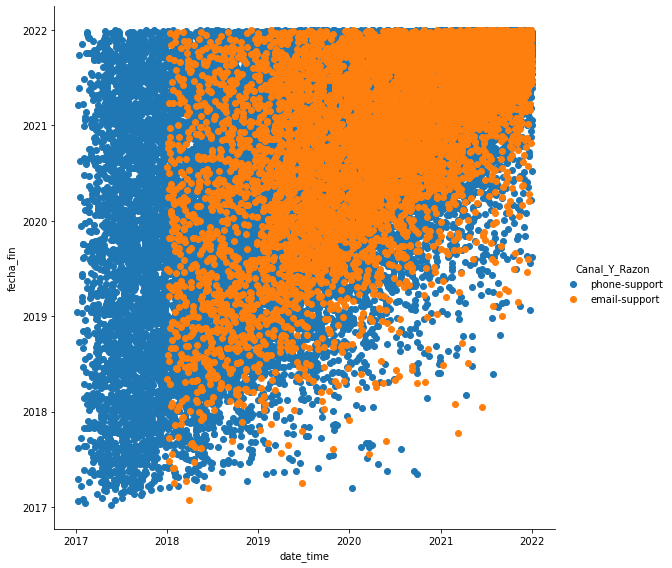

In [ ]:
dfSoporte = dfConCasos.loc[dfConCasos['reason']=='support']
sns.FacetGrid(dfSoporte,hue = 'Canal_Y_Razon' , height = 8).map(plt.scatter,'date_time','fecha_fin').add_legend();
plt.show()

Observamos la relacion entre los llamados por motivo de soporte al call center y la fecha de baja del cliente,
en la diagonal seria igual fecha de llamado a la fecha de baja, por debajo de la diagonal implica que los clientes han llamado luego de darse de baja, }}
En naranja se observan las consultas via mail y en azul las realizadas por telefono, es evidente que el canal mail se inicia a partir del 2018 y es el mas elegido con mayor frecuencia conforme avanza el tiempo.
seria interesante analizar las distancias entre la fecha de llamado y la fecha de baja.

In [ ]:
dfSoporteYBajas = dfSoporte.loc[dfSoporte['activo']=='Baja']
dfSoporteYBajas

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,case_id,date_time,channel,reason,indicador,duracion_meses,Canal_Y_Razon
9,C2454,53,male,2017-01-01,2021-06-01,1612 days,Baja,prd_1,annual_subscription,1200,12,CC32581,2018-05-31 16:44:29,phone,support,both,52,phone-support
17,C2459,62,female,2017-01-02,2018-10-14,650 days,Baja,prd_2,monthly_subscription,125,1,CC21231,2018-02-06 14:29:39,phone,support,both,21,phone-support
45,C2481,51,male,2017-01-02,2021-05-22,1601 days,Baja,prd_2,monthly_subscription,125,1,CC683,2017-01-15 13:35:56,phone,support,both,52,phone-support
46,C2481,51,male,2017-01-02,2021-05-22,1601 days,Baja,prd_2,monthly_subscription,125,1,CC32155,2018-05-28 12:23:57,phone,support,both,52,phone-support
49,C2483,61,male,2017-01-02,2018-05-09,492 days,Baja,prd_1,annual_subscription,1200,12,CC8475,2017-06-08 13:09:43,phone,support,both,16,phone-support
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573412,C504018,64,female,2021-11-23,2021-11-25,2 days,Baja,prd_2,monthly_subscription,125,1,CC327339,2021-12-21 15:15:23,phone,support,both,0,phone-support
574247,C504851,68,female,2021-11-26,2021-12-03,7 days,Baja,prd_2,monthly_subscription,125,1,CC321501,2021-12-03 14:34:20,phone,support,both,0,phone-support
575062,C505664,62,male,2021-12-01,2021-12-26,25 days,Baja,prd_2,monthly_subscription,125,1,CC328404,2021-12-24 17:11:26,phone,support,both,0,phone-support
576118,C506717,56,male,2021-12-06,2021-12-18,12 days,Baja,prd_2,monthly_subscription,125,1,CC326543,2021-12-19 11:39:04,phone,support,both,0,phone-support


In [ ]:
from datetime import date
dfSoporteYBajas['DistanciaABaja'] = dfSoporteYBajas['fecha_fin'] - dfSoporteYBajas['date_time']
dfSoporteYBajas['DistanciaABaja'] = dfSoporteYBajas['DistanciaABaja'].dt.days.astype('int64')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
dfSoporteYBajas.head()

,customer_id,age,gender,fecha_inicio,fecha_fin,duracion,activo,product_id,name,price,billing_cycle,case_id,date_time,channel,reason,indicador,duracion_meses,Canal_Y_Razon,DistanciaABaja
9,C2454,53,male,2017-01-01,2021-06-01,1612 days,Baja,prd_1,annual_subscription,1200,12,CC32581,2018-05-31 16:44:29,phone,support,both,52,phone-support,1096
17,C2459,62,female,2017-01-02,2018-10-14,650 days,Baja,prd_2,monthly_subscription,125,1,CC21231,2018-02-06 14:29:39,phone,support,both,21,phone-support,249
45,C2481,51,male,2017-01-02,2021-05-22,1601 days,Baja,prd_2,monthly_subscription,125,1,CC683,2017-01-15 13:35:56,phone,support,both,52,phone-support,1587
46,C2481,51,male,2017-01-02,2021-05-22,1601 days,Baja,prd_2,monthly_subscription,125,1,CC32155,2018-05-28 12:23:57,phone,support,both,52,phone-support,1089
49,C2483,61,male,2017-01-02,2018-05-09,492 days,Baja,prd_1,annual_subscription,1200,12,CC8475,2017-06-08 13:09:43,phone,support,both,16,phone-support,334


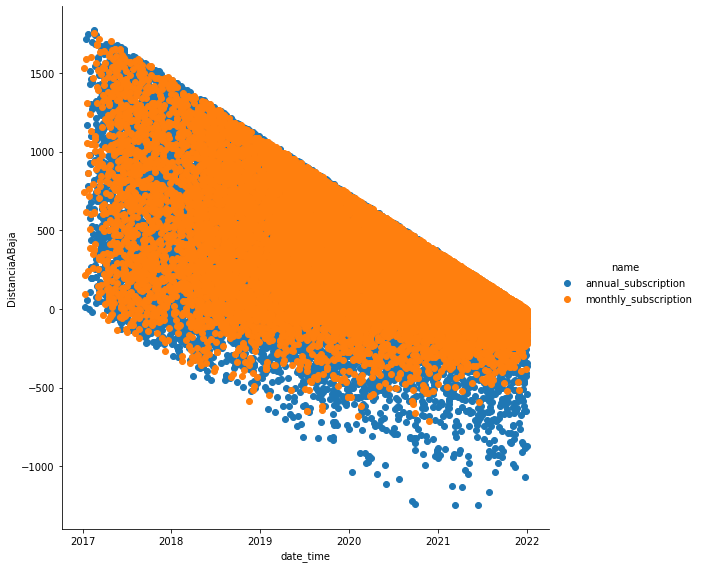

In [ ]:
sns.FacetGrid(dfSoporteYBajas,hue = 'name' , height = 8).map(plt.scatter,'date_time','DistanciaABaja').add_legend();
plt.show()

Distancia en dias entre la fecha de llamado a soporte y la fecha de baja a las suscripciones...
Solo se tienen en cuenta clientes dados de baja.
Hay ya
*Las fechas negativas, son llamados posteriores a las bajas*
es una grafica que decrece a medida que aumentan las fechas, pero el rango de distancia parece mantenerse a lo largo de las fechas.

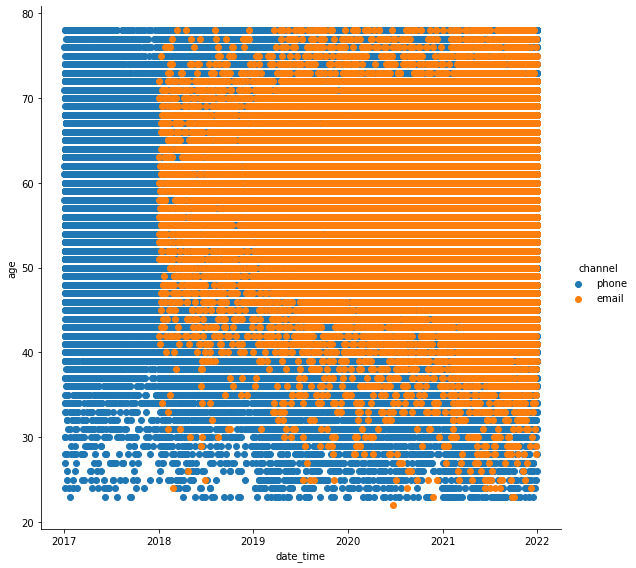

In [ ]:
sns.FacetGrid(dfConCasos,hue = 'channel' , height = 8).map(plt.scatter,'date_time','age').add_legend();
plt.show()

Relacion entre fecha de llamado al call center, la edad de los clientes y que canal utilizan, 

de la imagen parece que el canal email debe haber iniciado luego del 2018.
ademas que menores de 35 parecen preferir mayormente el canal telefonico.

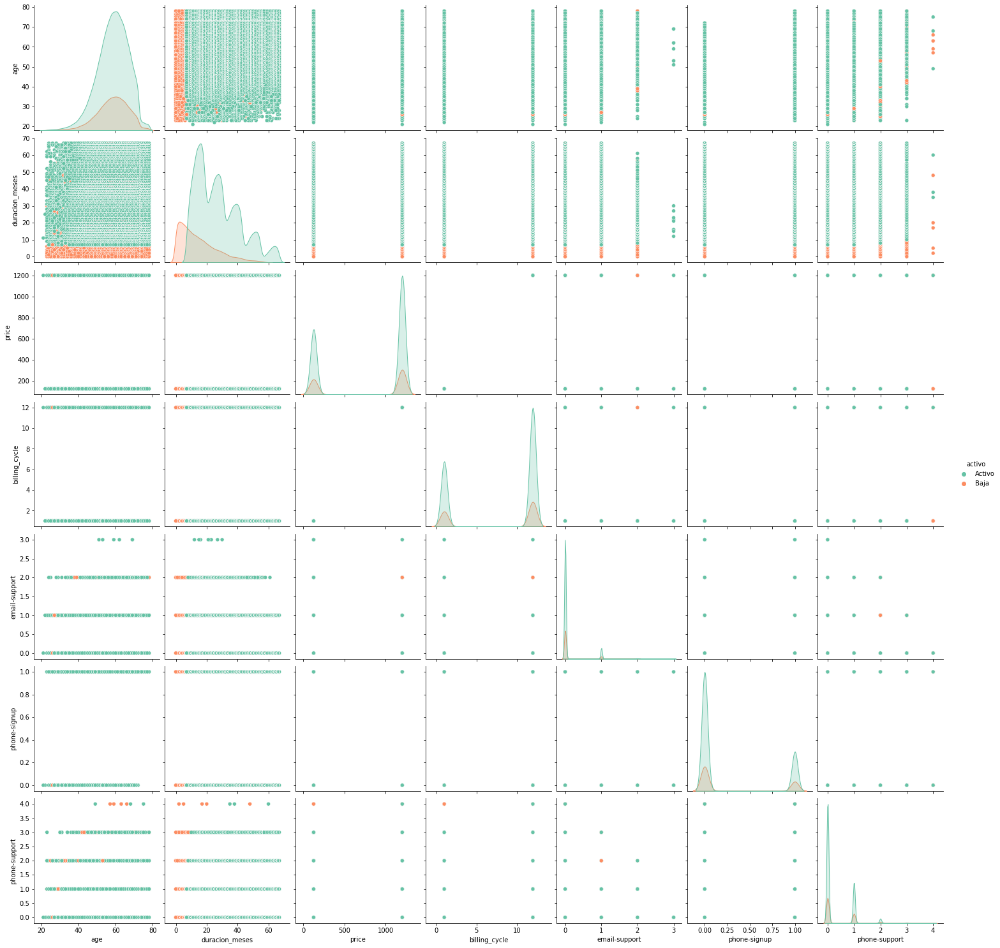

In [ ]:
#Pairplot
sns.pairplot(dfAnalisis,hue = 'activo' , height = 3 , palette = 'Set2')

Analisis de todas las variables numericas OBSERVANDO si existendiferencias respecto si el usuario esta todavia Activo con el producto o si se dió de baja.


*   **Edad**: entre 20 y 80 años. La distribucion es similar tanto para clientes de baja como en alta.
*   edad-duracion: la duarcion en meses parece uniforme entre todas las edades y solo se observa en menores a 3 algunas bajas de mayor duracion  respecto a las otras edades.
* edad-producto(billing_cycle/price) es similar para todas las edades.
* edad-email-support:  frecuencias de llamado entre 0 y 3, muy pocas bajas, mas de dos llamados a partir de los 50 años aproximadamente.
* edad-phone-signup:  frecuencias de llamado entre 0 y 1, muy pocas bajas.
* edad-phone-support:  frecuencias de llamado entre 0 y 4, mas de 3 llamados a partir de los 50 años aproximadamente.

*   **duracion**: la duarcion en meses se distribuye muy distinta entre usuarios que se mantienen en el producto y los que se dieron de baja.
  ** los que se mantienen en el producto muestran picos ciclicos que van decreciendo pero porque seguramente sean altas al producto mas nuevas, se debe hacer un analisis por producto porque los picos se dan aproximadamente cada 12 meses que deben ser donde se suman suscripciones anuales.
  ** los usuarios que se dan de baja en el proucto una distribucion asimetrica hacia la derecha, el pico de maxima duracion es inferior a los 20 meses.
* duracion-producto(billing_cycle/price) es similar para todos los productos y en ambos las bajas tienen duraciones como maximo aproximado 20 meses.
* duracion-email-support:  es similar para todas las cantidades.
* duracion-phone-signup:  frecuencias de llamado entre 0 y 1, muy pocas bajas.
* duracion-phone-support:  frecuencias de llamado entre 0 y 4, mas de 3 llamados tiene mayor cantidad de bajas incluso con mayor duracion.

*   **Producto (billing_cycle/price)**:dos productos, se observa que hay mayor cantidad de suscripciones mensuales que anuales, pero ambas se distribuyen de manera simetrica tanto los usuarios que estan activos como los que se dieron de baja..
  
* producto-email-support /producto-phone-signup / producto-phone-support:  es similar para ambos productos.





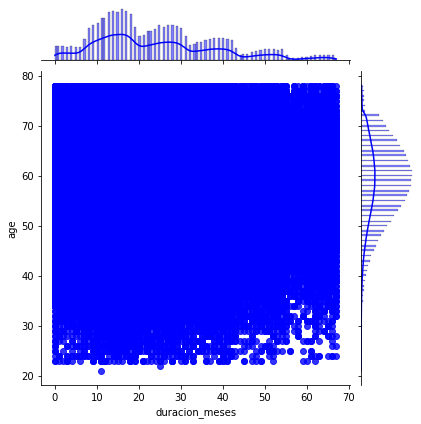

In [ ]:
sns.jointplot(x='duracion_meses',y='age',data=dfAnalisis,kind = 'reg',color = 'blue')
plt.show()

In [ ]:
import plotly.express as px

In [ ]:
#Completar
px.scatter(dfAnalisis, x='age',
           y='duracion_meses',
           marginal_x='histogram',
           marginal_y='histogram',
           trendline='ols',
           trendline_color_override='red')

<Figure size 1440x360 with 0 Axes>

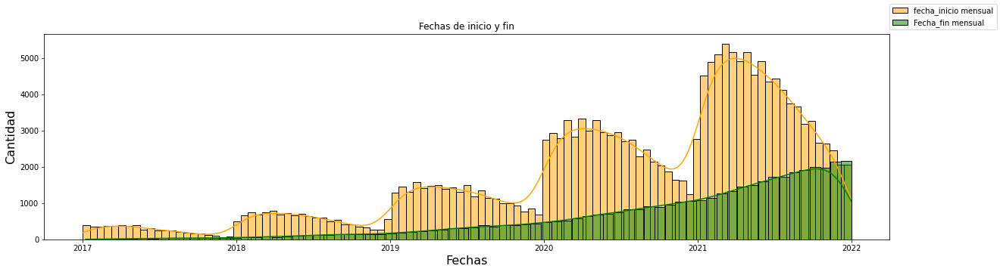

In [ ]:

dfmensual=df.loc[df['name']!='annual_subscription']
dfmensualBaja=df_bajas.loc[df_bajas['name']!='annual_subscription']


dfanual=df.loc[df['name']=='annual_subscription']
dfanualBaja=df_bajas.loc[df_bajas['name']=='annual_subscription']

plt.figure(figsize=(20,5))
fig=plt.figure(figsize=(20,5))


sns.histplot(dfmensual.fecha_inicio, kde=True,  label="fecha_inicio mensual",color='orange')
sns.histplot(dfmensualBaja.fecha_fin, kde=True,  label="Fecha_fin mensual", color='green')
fig.legend()
plt.title("Fechas de inicio y fin")
plt.xlabel("Fechas", size = 16)
plt.ylabel("Cantidad", size = 16)
plt.show()


Las suscripciones parecen ser estacionales, al principio de año se dan las altas y van decreciendo hasta finalizar el año, al año siguiente aumentan las cantidad de suscripciones respecto al mismo mes del año anterior, el analizis se hace sobre el proucto mensual.

La cantidad de bajas por fecha van incrementando sin estacionalidad a medida que avanzan las fechas.

<Figure size 1440x360 with 0 Axes>

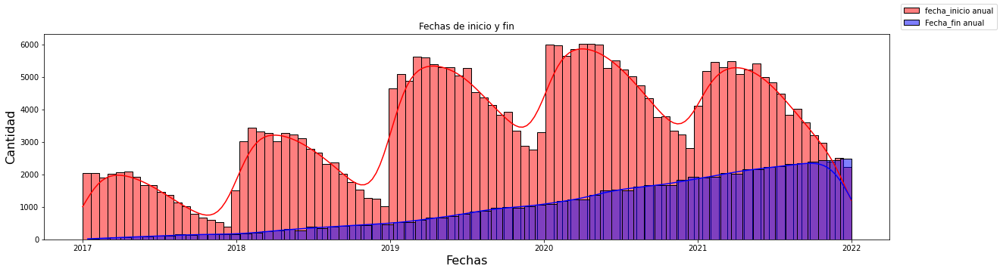

In [ ]:

plt.figure(figsize=(20,5))
fig=plt.figure(figsize=(20,5))


sns.histplot(dfanual.fecha_inicio, kde=True,  label="fecha_inicio anual",color='red')
sns.histplot(dfanualBaja.fecha_fin, kde=True,  label="Fecha_fin anual", color='blue')
fig.legend()
plt.title("Fechas de inicio y fin")
plt.xlabel("Fechas", size = 16)
plt.ylabel("Cantidad", size = 16)
plt.show()

Similar al caso anteriori, aumento de las altas a principio de año y decrecen las altas hasta el principio del año siguiente.

las bajas van aumentando gradualmente a medida que avanzan los dias.
